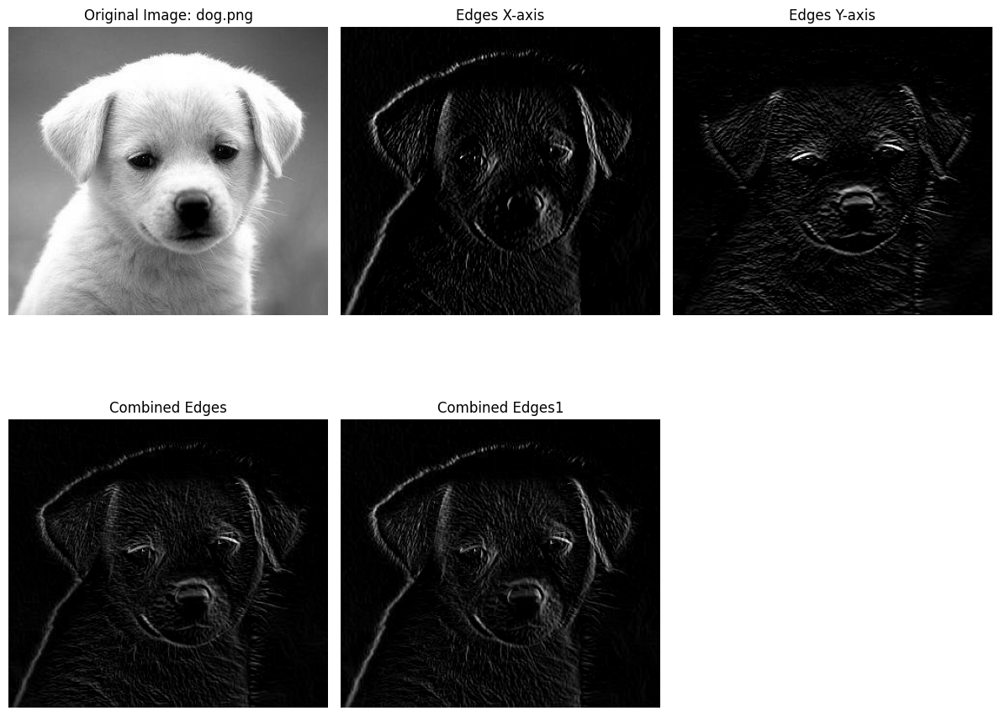

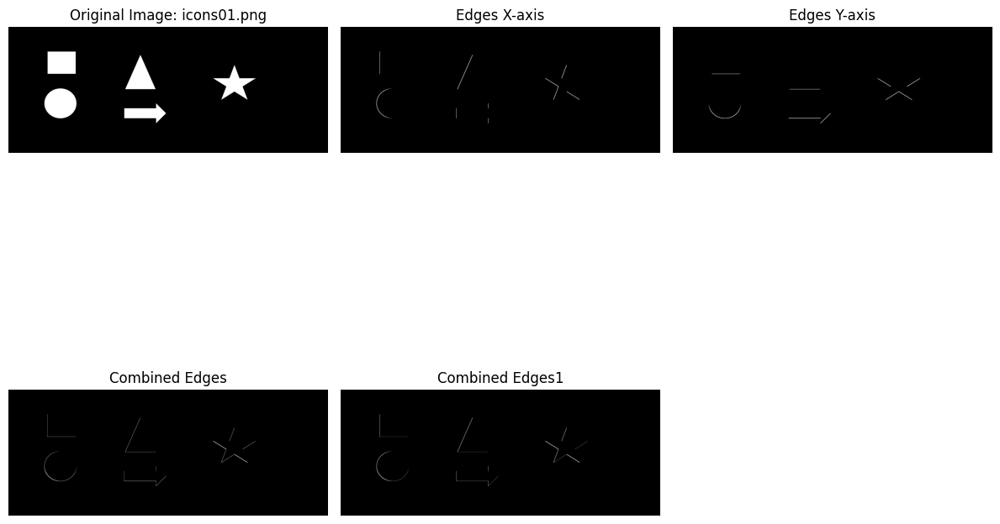

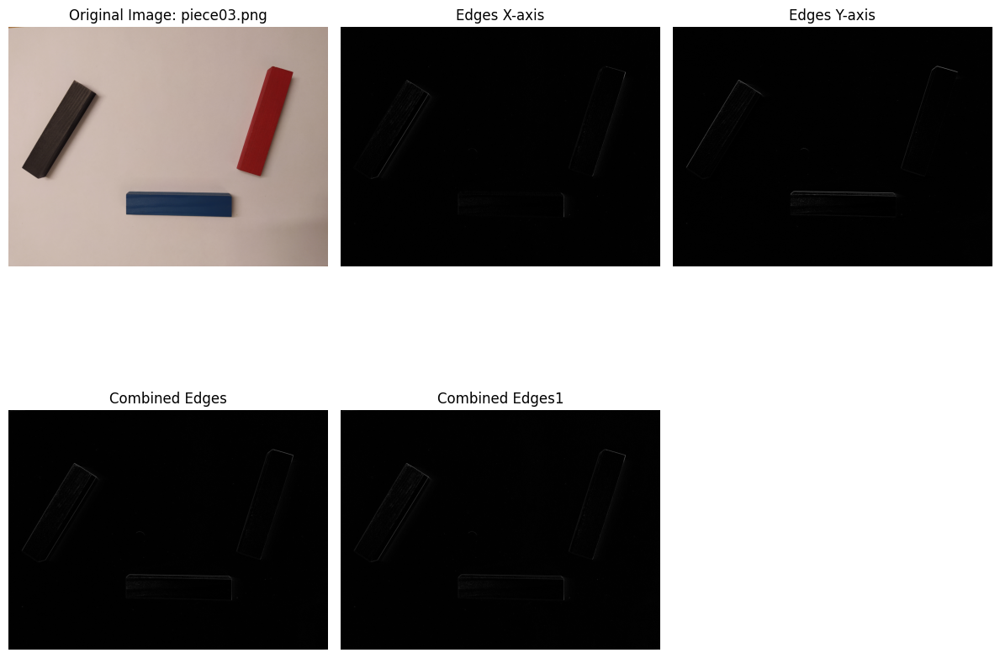

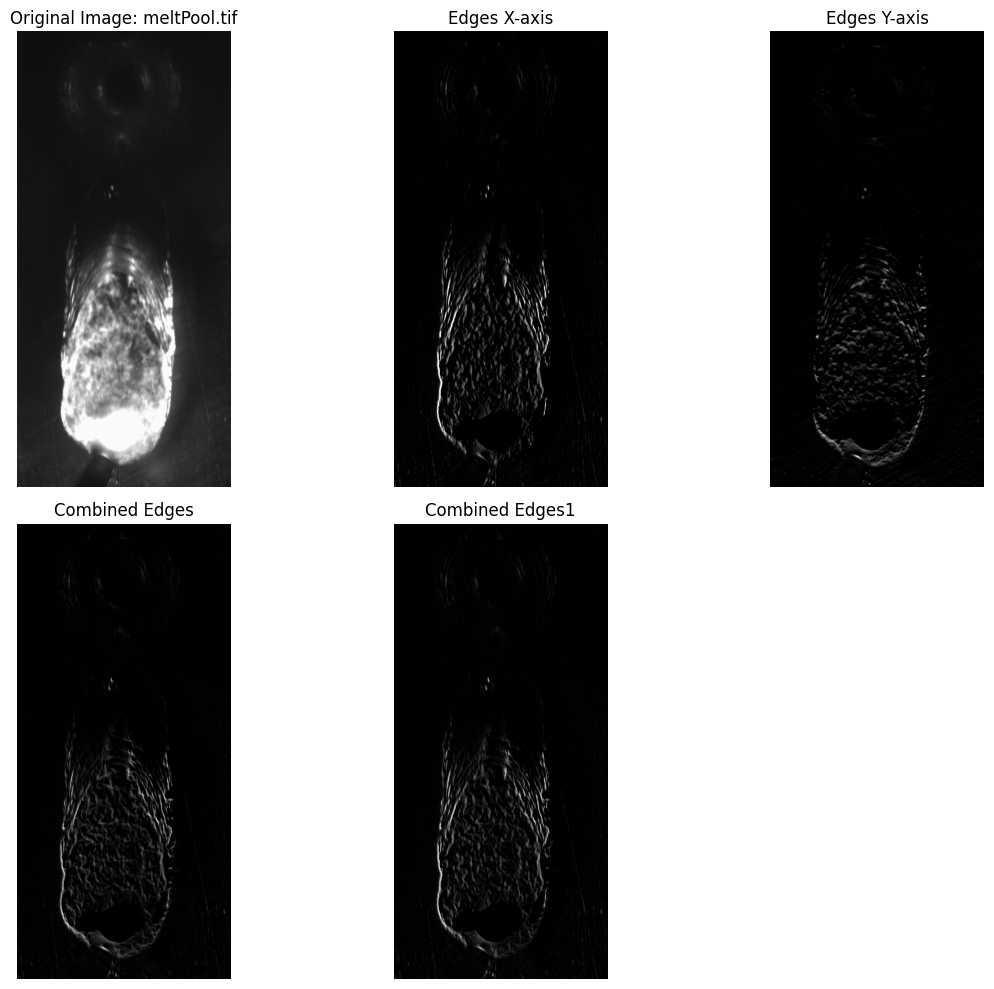

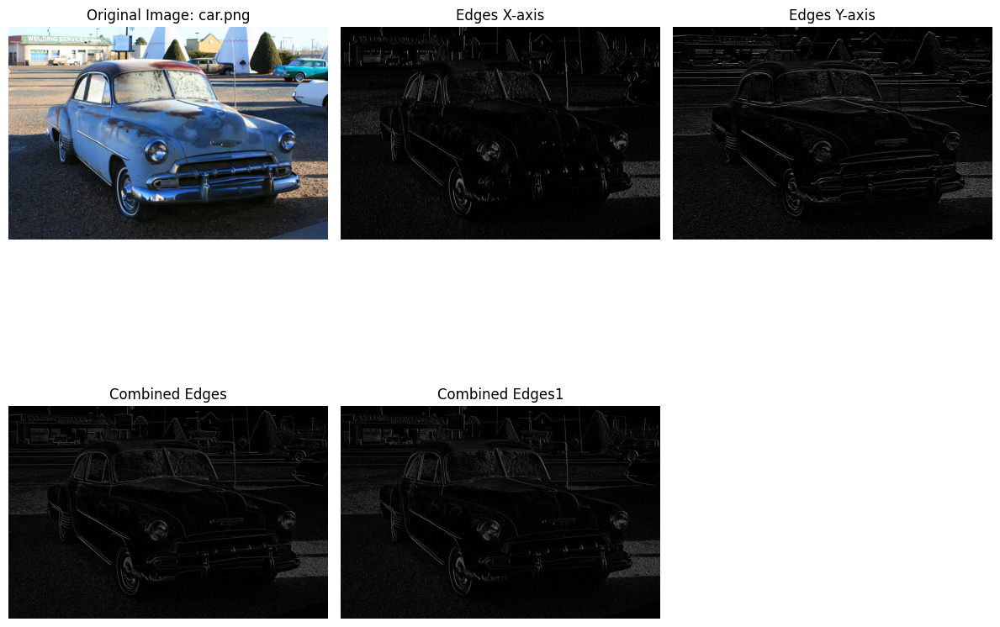

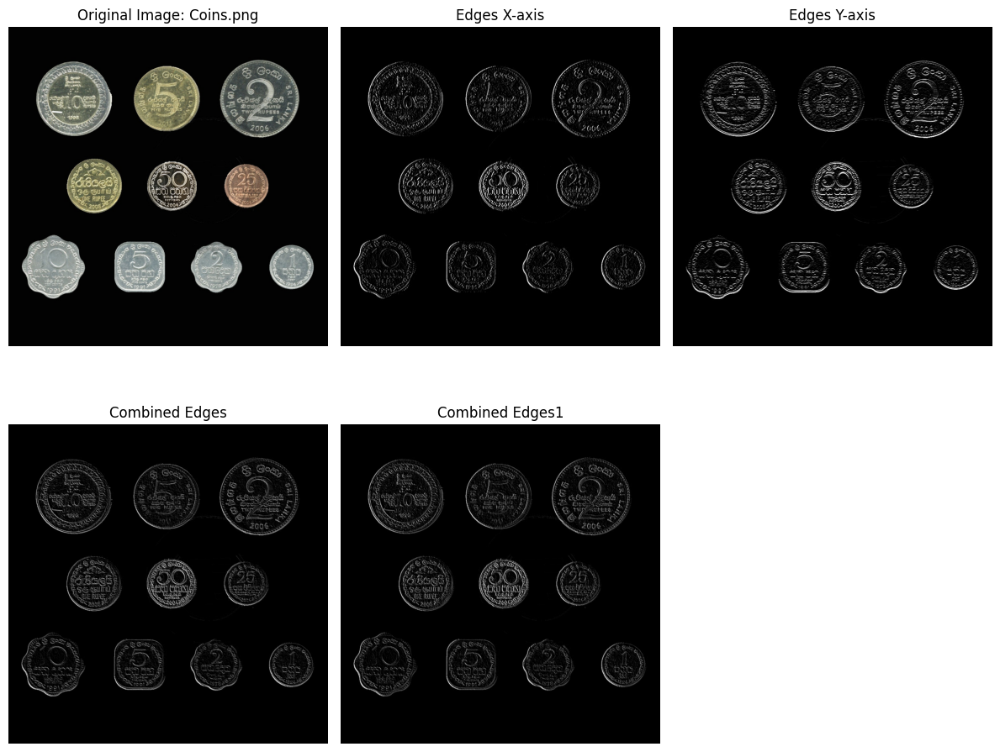

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

image_dir = "/Users/stefenkaushik/Downloads/lab4/lab4_pics"  

prewitt_x = np.array([[-1, 0, 1], 
                      [-1, 0, 1], 
                      [-1, 0, 1]])
prewitt_y = np.array([[1, 1, 1], 
                      [0, 0, 0], 
                      [-1, -1, -1]])

for i, file_name in enumerate(os.listdir(image_dir)):
    file_path = os.path.join(image_dir, file_name)
    
   
    image = cv2.imread(file_path)
    
    if image is None:
        print(f"Warning: Unable to load image {file_name}. Skipping.")
        continue

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)


    edges_x = cv2.filter2D(gray_image, -1, prewitt_x)
    edges_y = cv2.filter2D(gray_image, -1, prewitt_y)
    combined_edges = cv2.addWeighted(edges_x, 0.5, edges_y, 0.5, 0)

    combined_edges1 = cv2.addWeighted(edges_x, 0.7, edges_y, 0.3, 0)

    plt.figure(figsize=(12, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  
    plt.title(f'Original Image: {file_name}')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(edges_x, cmap='gray')
    plt.title('Edges X-axis')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(edges_y, cmap='gray')
    plt.title('Edges Y-axis')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(combined_edges, cmap='gray')
    plt.title('Combined Edges')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(combined_edges1, cmap='gray')
    plt.title('Combined Edges1')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

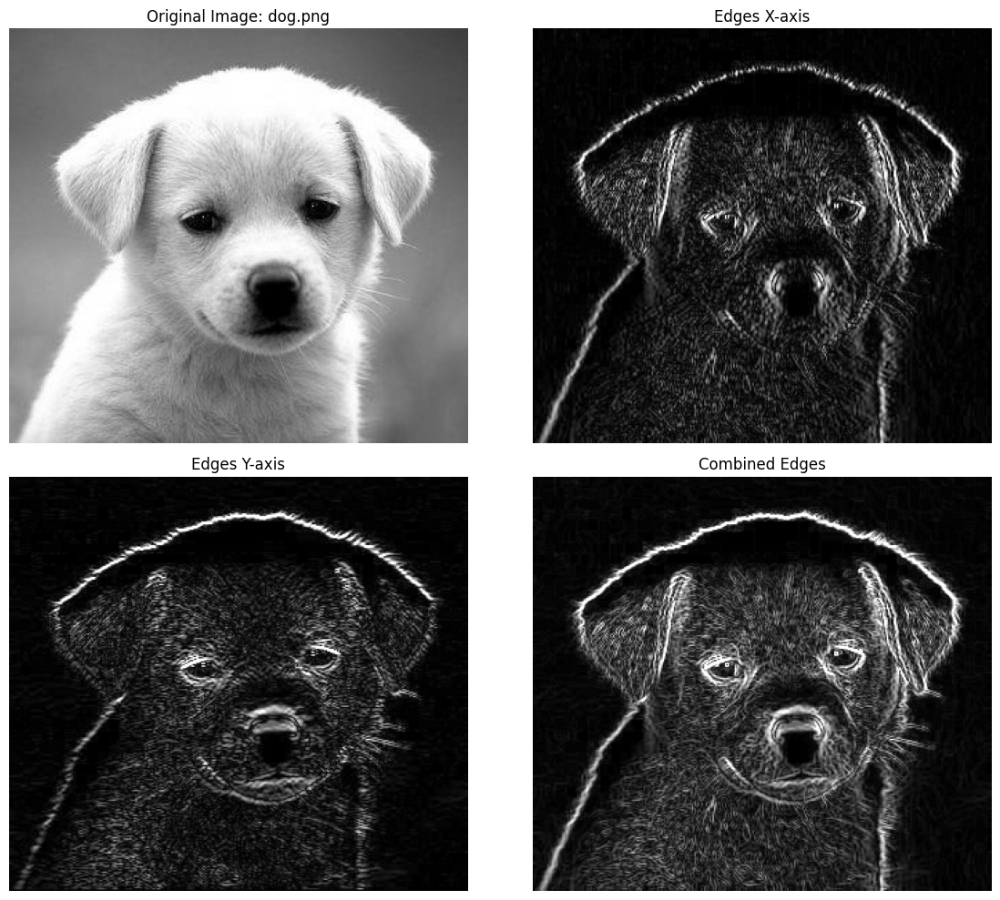

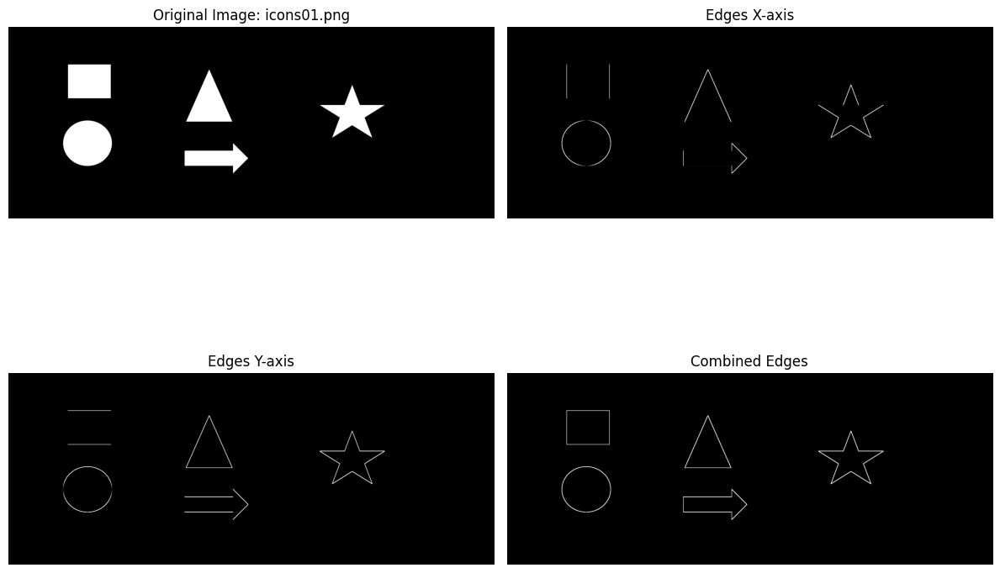

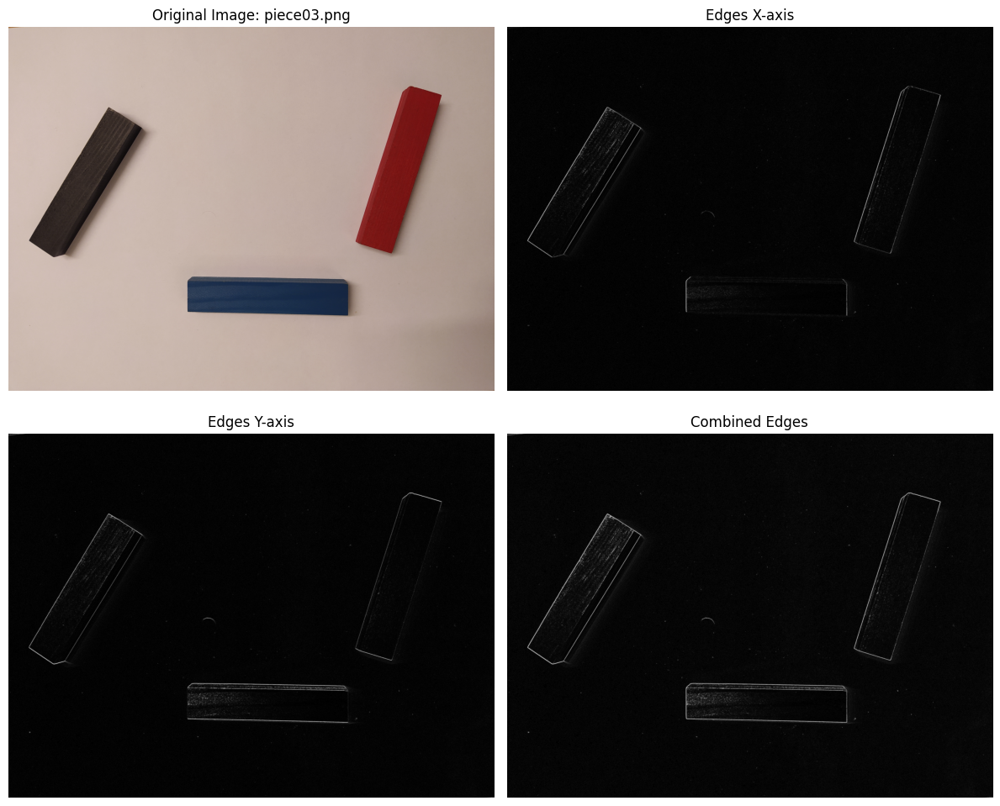

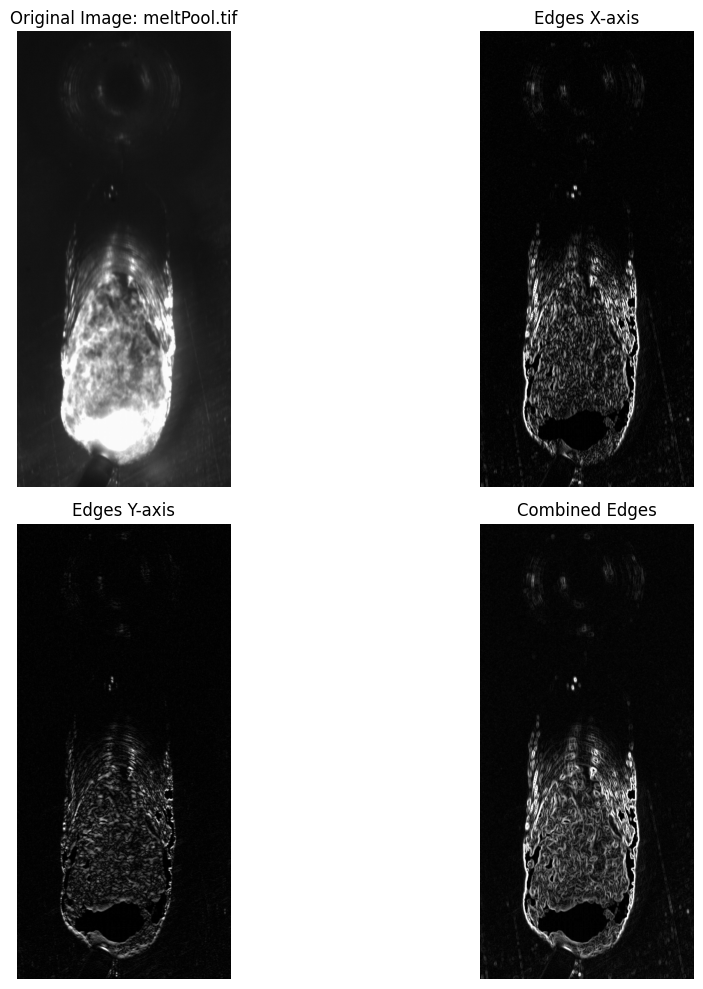

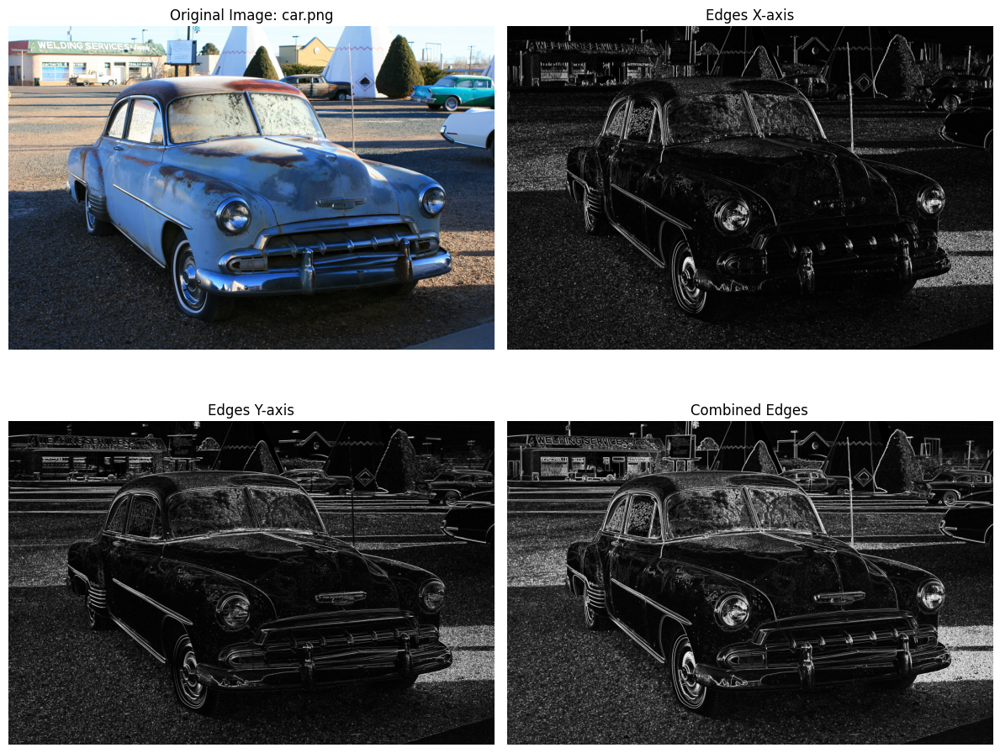

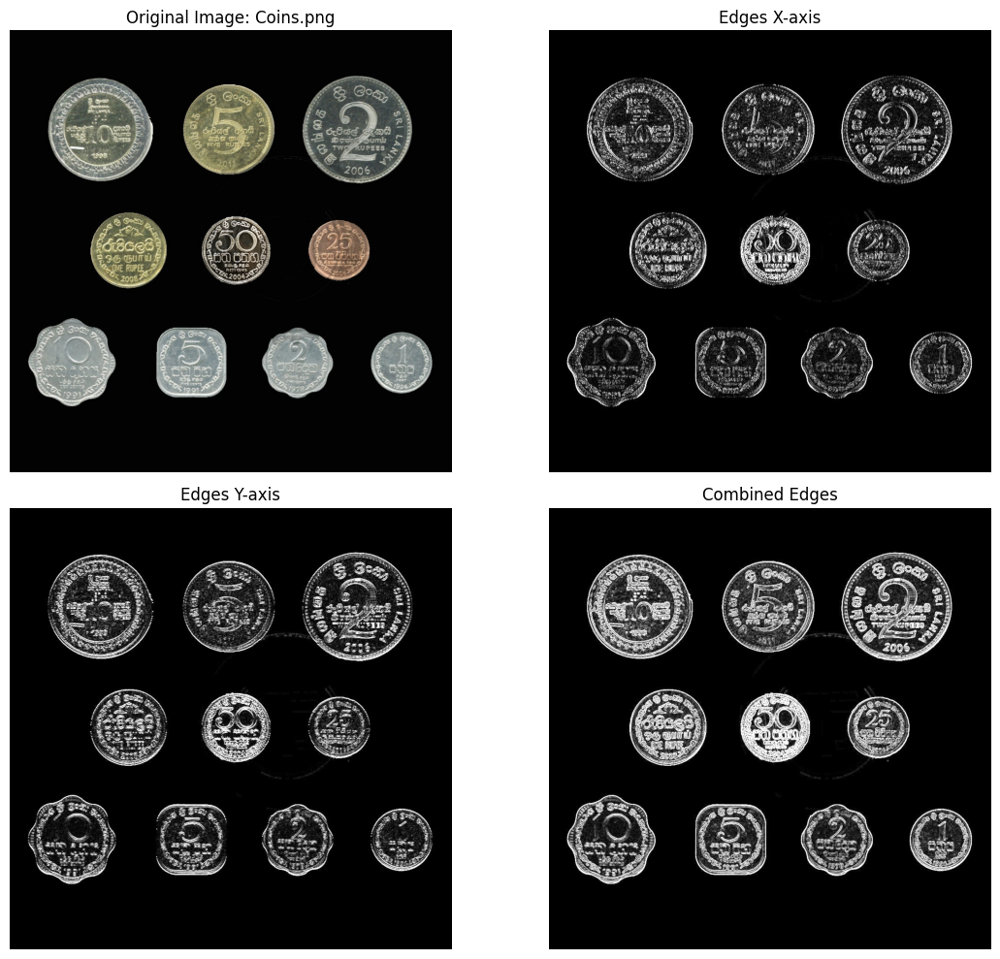

In [9]:
for i, file_name in enumerate(os.listdir(image_dir)):
    file_path = os.path.join(image_dir, file_name)
    
    image = cv2.imread(file_path)
    

    if image is None:
        print(f"Warning: Unable to load image {file_name}. Skipping.")
        continue

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)  
    sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3) 
    combined_edges = cv2.magnitude(sobel_x, sobel_y)

    sobel_x = cv2.convertScaleAbs(sobel_x)
    sobel_y = cv2.convertScaleAbs(sobel_y)
    combined_edges = cv2.convertScaleAbs(combined_edges)

    plt.figure(figsize=(12, 10))

    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 
    plt.title(f'Original Image: {file_name}')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(sobel_x, cmap='gray')
    plt.title('Edges X-axis')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(sobel_y, cmap='gray')
    plt.title('Edges Y-axis')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(combined_edges, cmap='gray')
    plt.title('Combined Edges')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

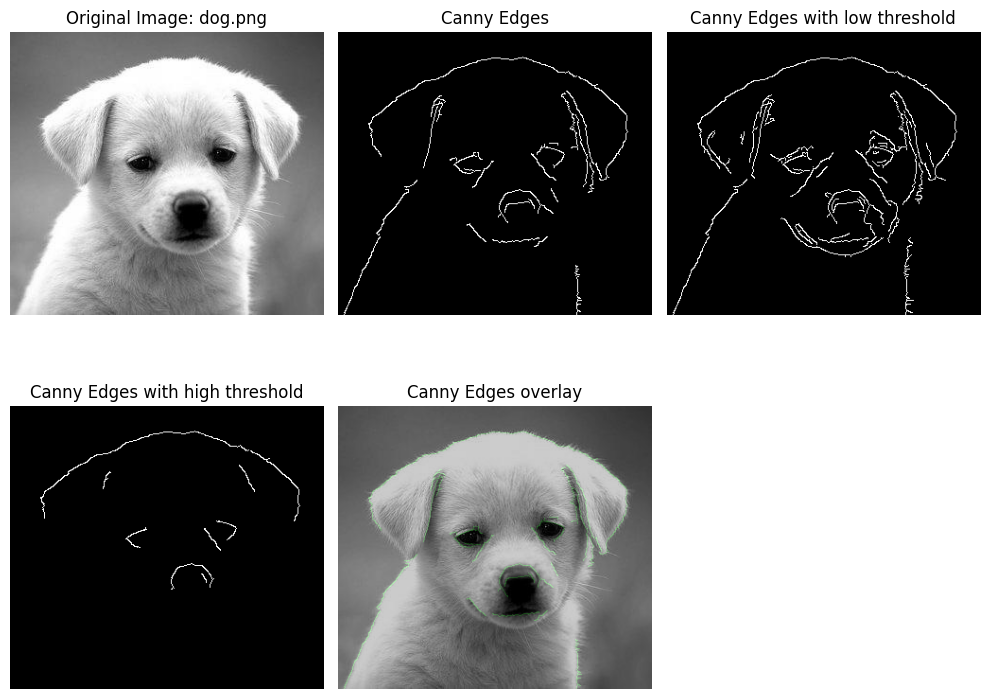

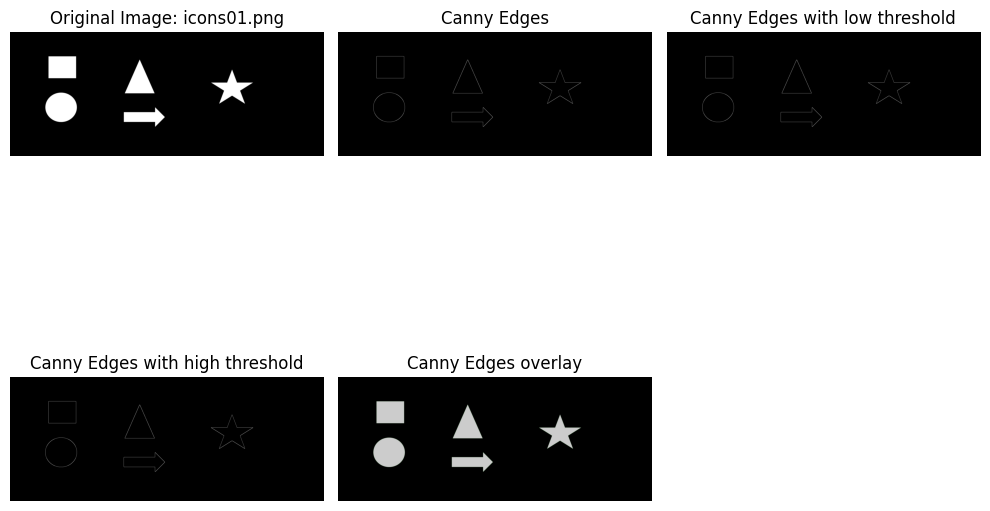

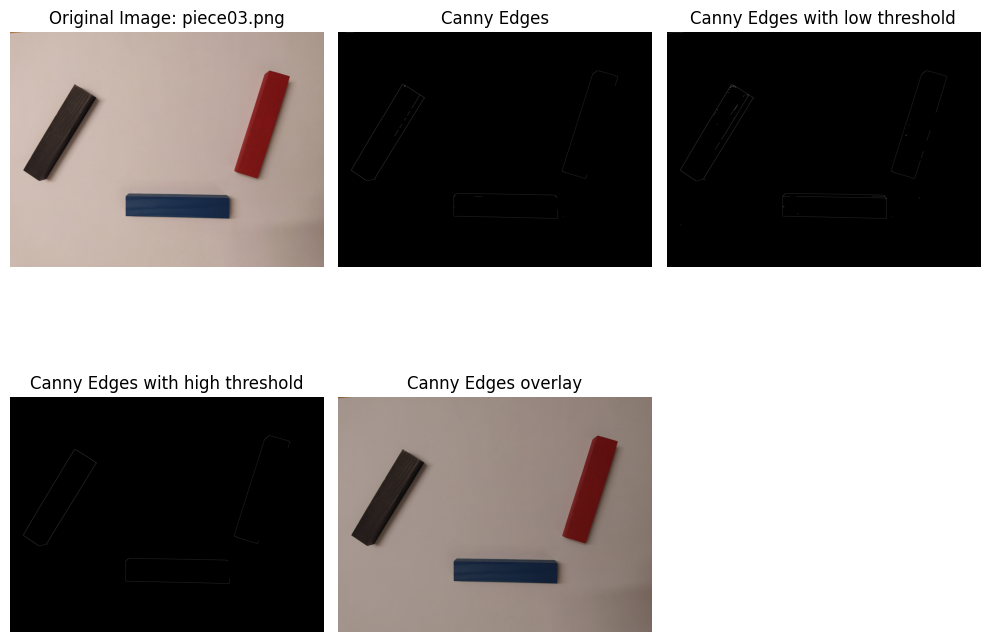

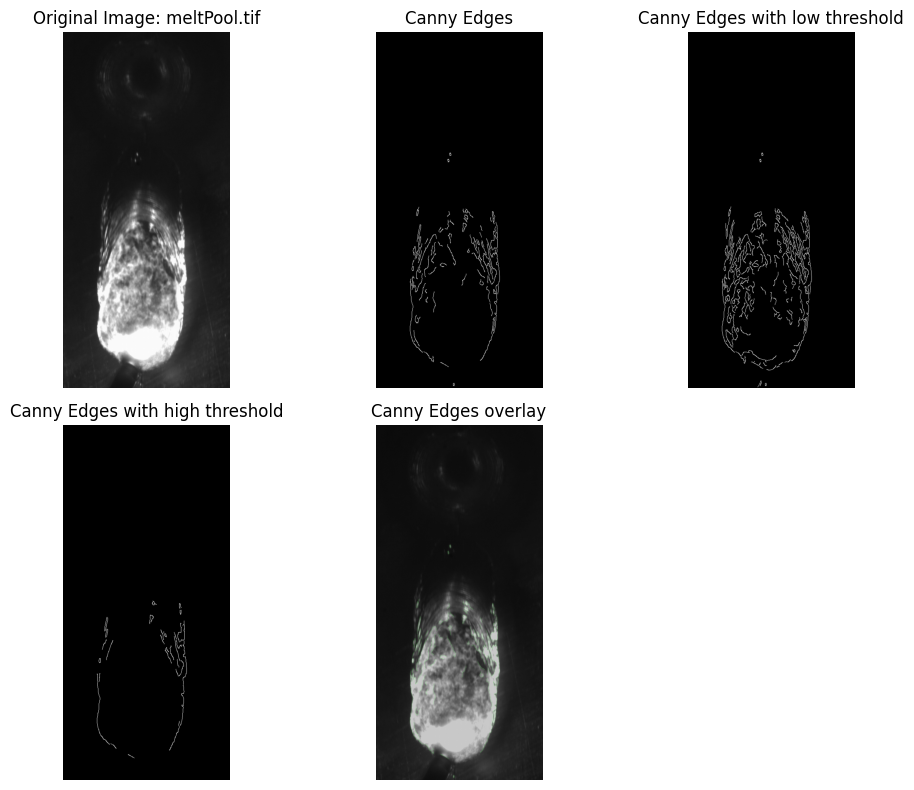

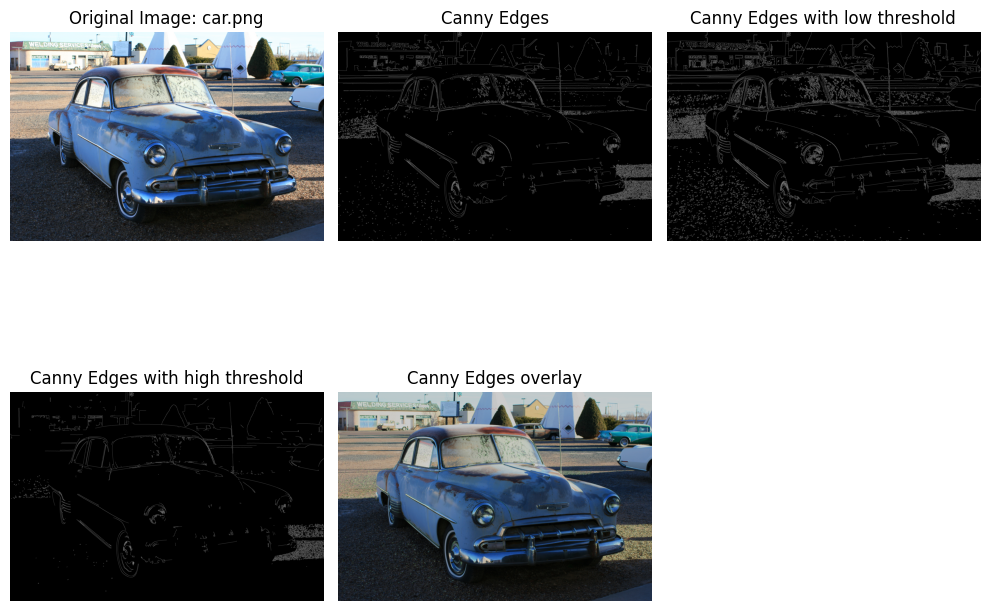

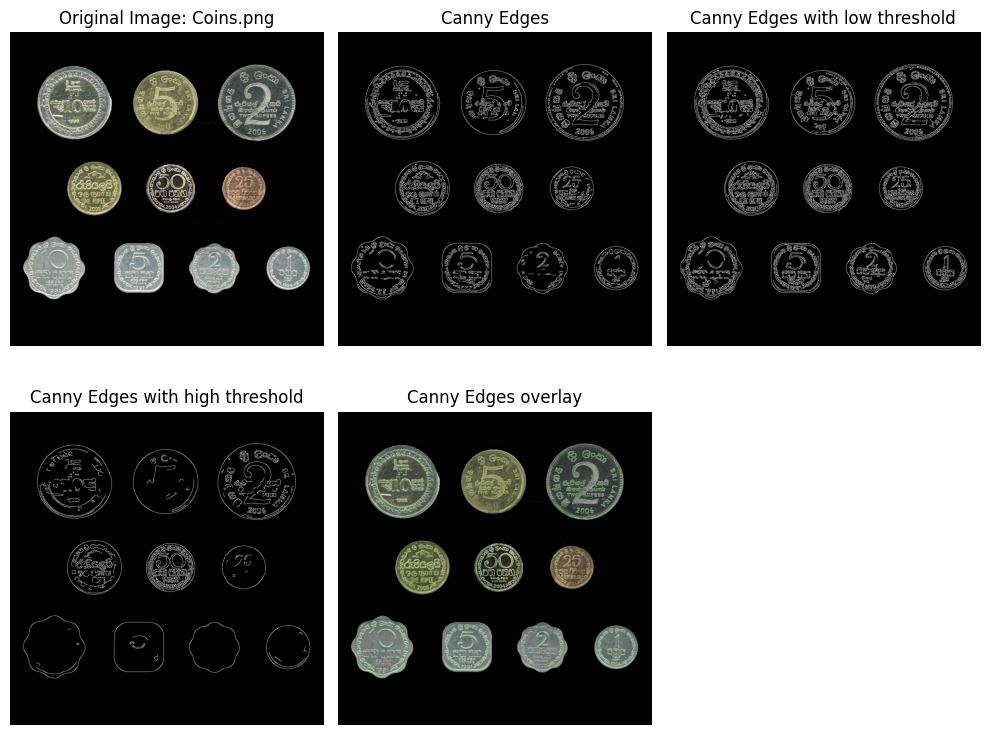

In [18]:
minVal = 100 
maxVal = 200 

minVal1=50
maxVal1=150

minVal2=150
maxVal2=300

for i, file_name in enumerate(os.listdir(image_dir)):
    file_path = os.path.join(image_dir, file_name)
    
    image = cv2.imread(file_path)
    
    if image is None:
        print(f"Skipping {file_name}: Not a valid image.")
        continue

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

    edges = cv2.Canny(blurred_image, minVal, maxVal)

    edges1 = cv2.Canny(blurred_image, minVal1, maxVal1)

    edges2 = cv2.Canny(blurred_image, minVal2, maxVal2)

    colored_edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

    colored_edges[np.where((colored_edges == [255, 255, 255]).all(axis=2))] = [0, 255, 0]

    overlay = cv2.addWeighted(image, 0.8, colored_edges, 0.2, 0)
    

    plt.figure(figsize=(10, 8))

    plt.subplot(2, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 
    plt.title(f'Original Image: {file_name}')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(edges, cmap='gray')
    plt.title('Canny Edges')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(edges1, cmap='gray')
    plt.title('Canny Edges with low threshold')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(edges2, cmap='gray')
    plt.title('Canny Edges with high threshold')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title('Canny Edges overlay')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

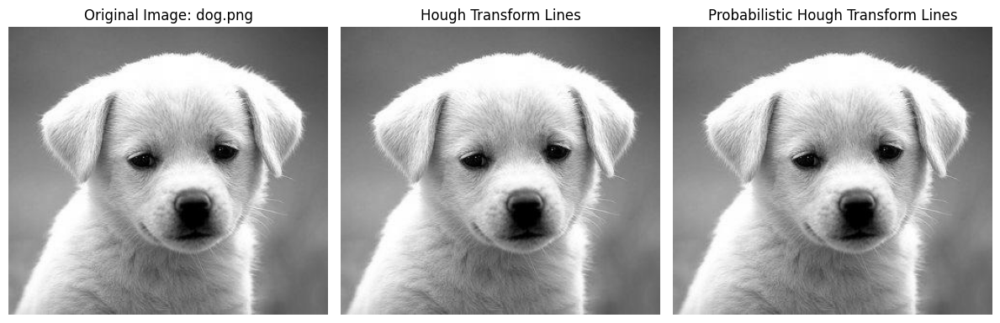

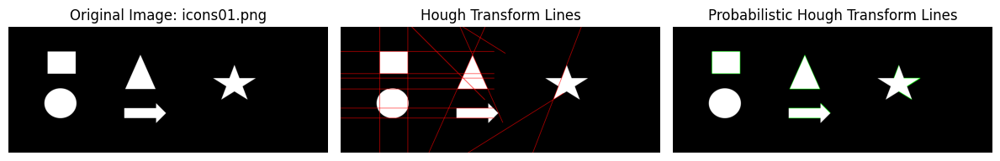

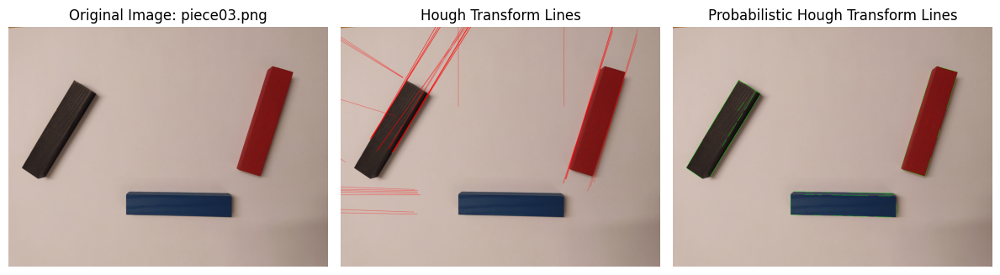

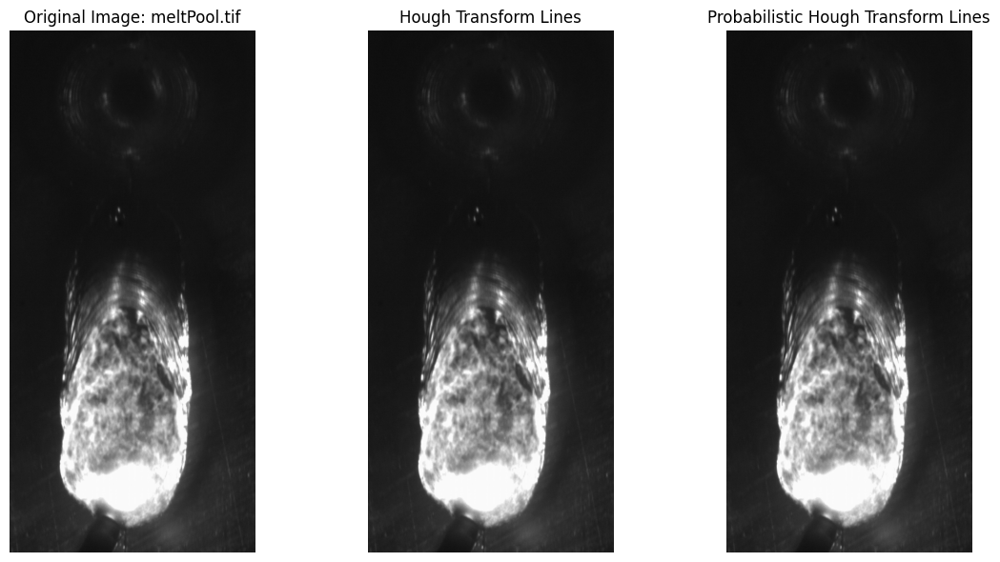

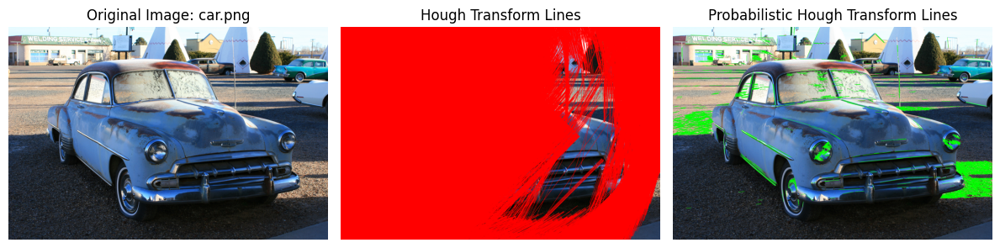

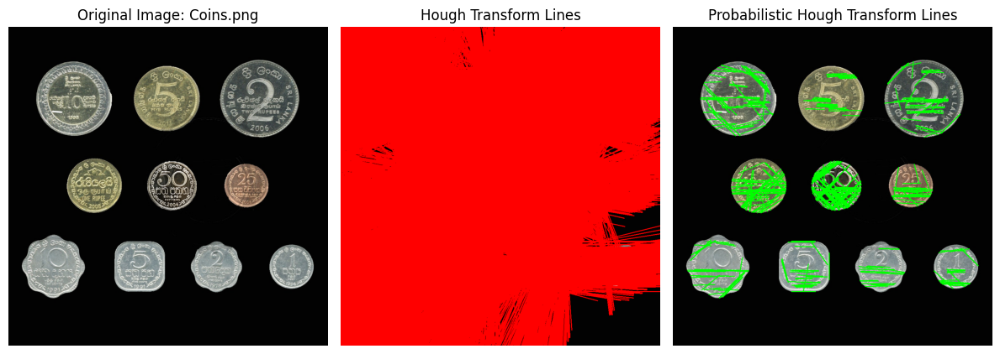

In [5]:
for i, file_name in enumerate(os.listdir(image_dir)):
    file_path = os.path.join(image_dir, file_name)
    
   
    image = cv2.imread(file_path)
    
    if image is None:
        print(f"Skipping {file_name}: Not a valid image.")
        continue

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

    edges = cv2.Canny(blurred_image, 50, 150)

    lines = cv2.HoughLines(edges, 1, np.pi / 180, 100)

    lines_p = cv2.HoughLinesP(edges, 1, np.pi / 180, 100, minLineLength=50, maxLineGap=10)

    image_hough = image.copy()

    if lines is not None:
        for line in lines:
            rho, theta = line[0]
            x1 = int(rho * np.cos(theta) + 1000 * (-np.sin(theta)))
            y1 = int(rho * np.sin(theta) + 1000 * (np.cos(theta)))
            x2 = int(rho * np.cos(theta) - 1000 * (-np.sin(theta)))
            y2 = int(rho * np.sin(theta) - 1000 * (np.cos(theta)))
            cv2.line(image_hough, (x1, y1), (x2, y2), (0, 0, 255), 2)

    image_hough_p = image.copy()

    if lines_p is not None:
        for line in lines_p:
            x1, y1, x2, y2 = line[0]
            cv2.line(image_hough_p, (x1, y1), (x2, y2), (0, 255, 0), 2)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  
    plt.title(f'Original Image: {file_name}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(image_hough, cv2.COLOR_BGR2RGB))  
    plt.title('Hough Transform Lines')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(image_hough_p, cv2.COLOR_BGR2RGB))  
    plt.title('Probabilistic Hough Transform Lines')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

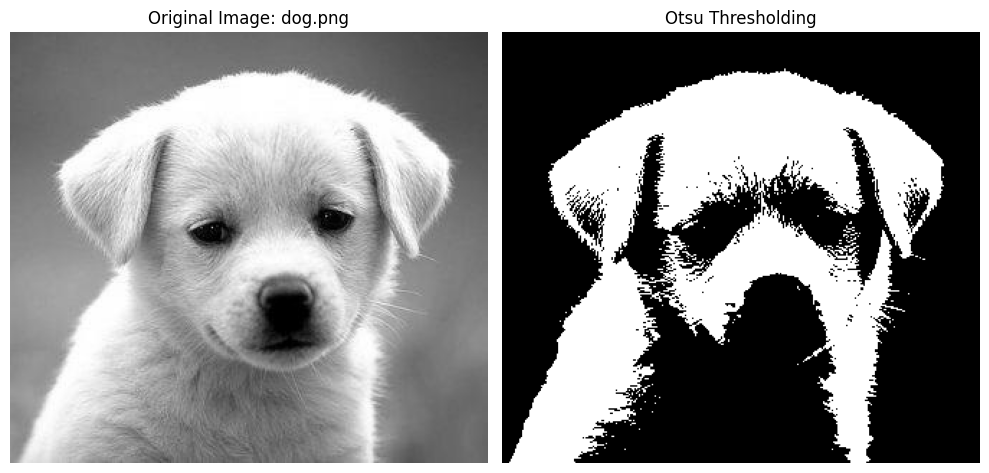

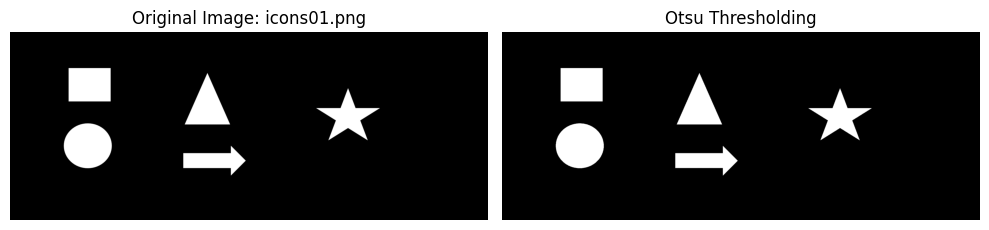

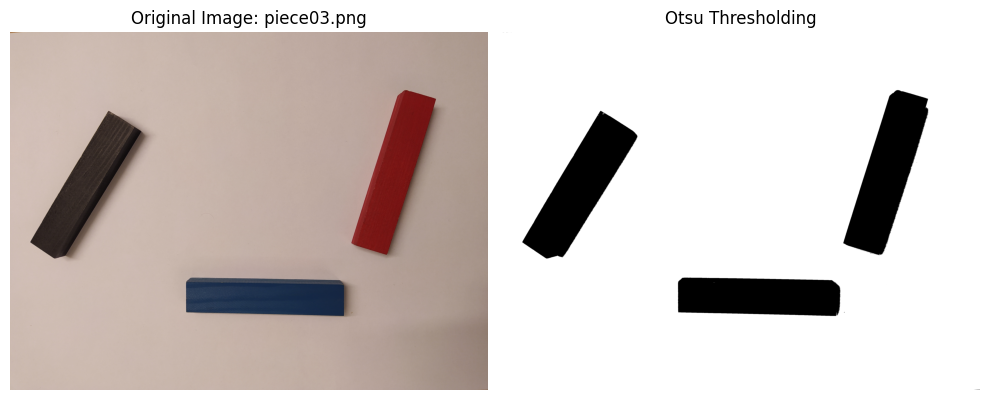

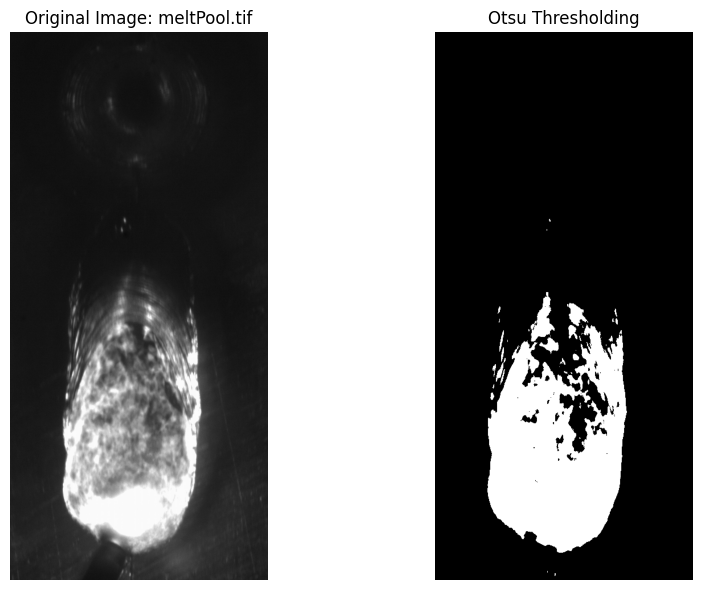

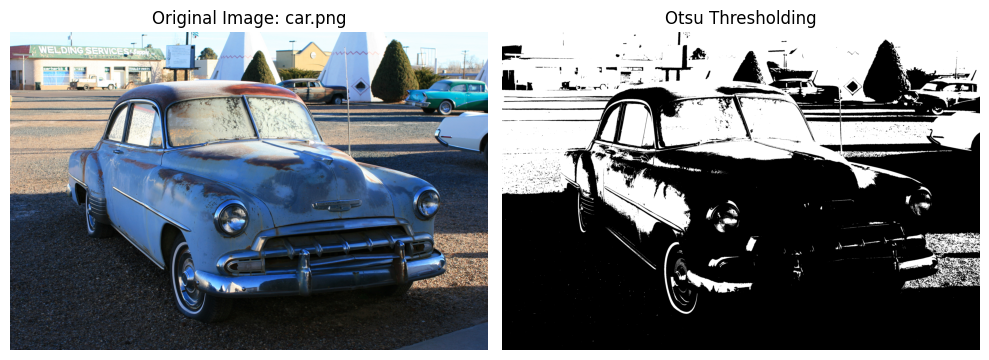

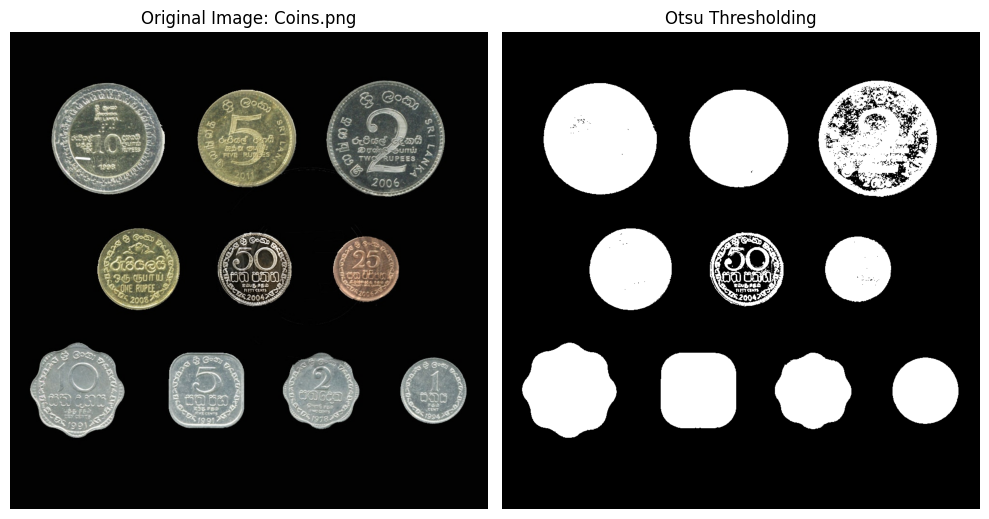

In [6]:
for i, file_name in enumerate(os.listdir(image_dir)):
    file_path = os.path.join(image_dir, file_name)
    
    image = cv2.imread(file_path)
    
    if image is None:
        print(f"Skipping {file_name}: Not a valid image.")
        continue

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    ret, otsu_thresholded_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    plt.figure(figsize=(10, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  
    plt.title(f'Original Image: {file_name}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(otsu_thresholded_image, cmap='gray')
    plt.title('Otsu Thresholding')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

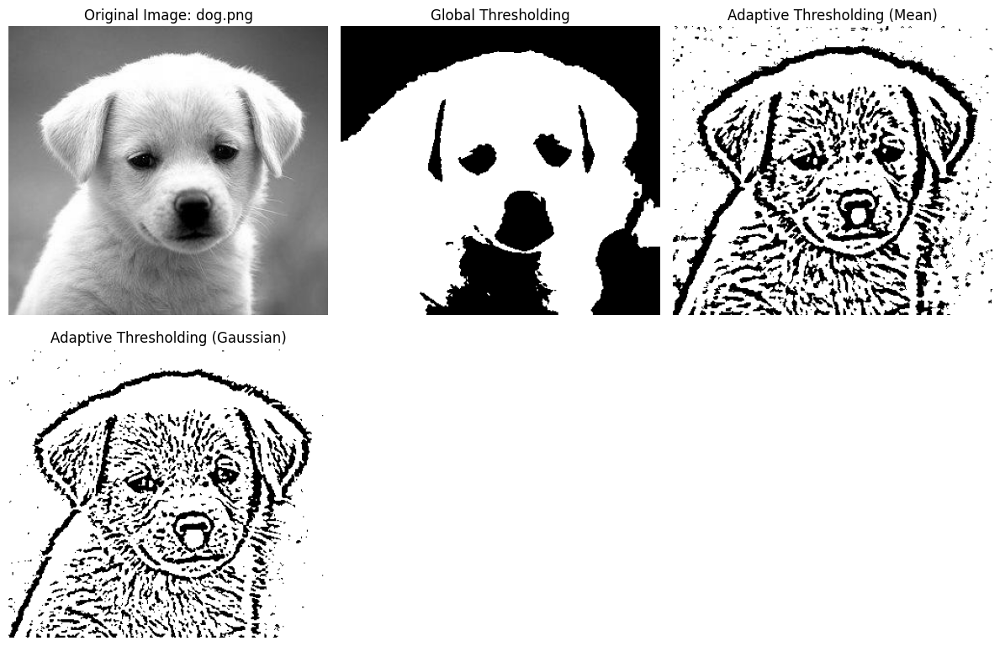

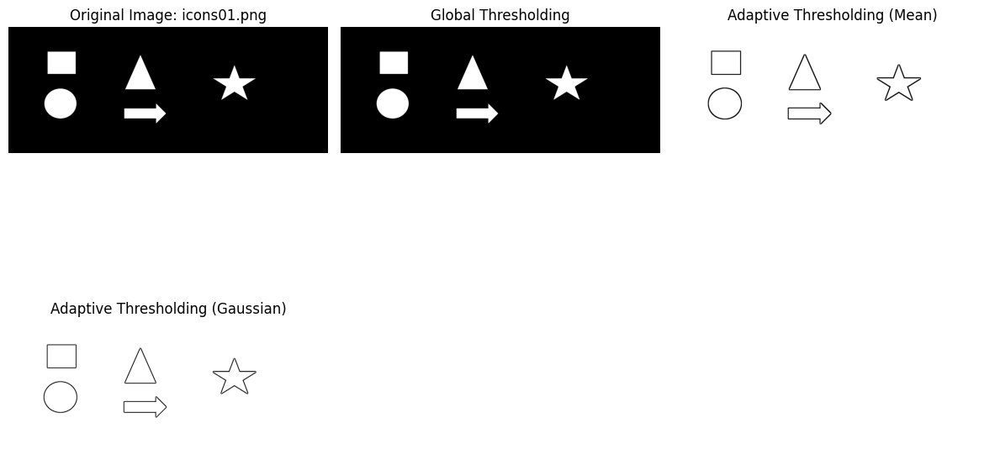

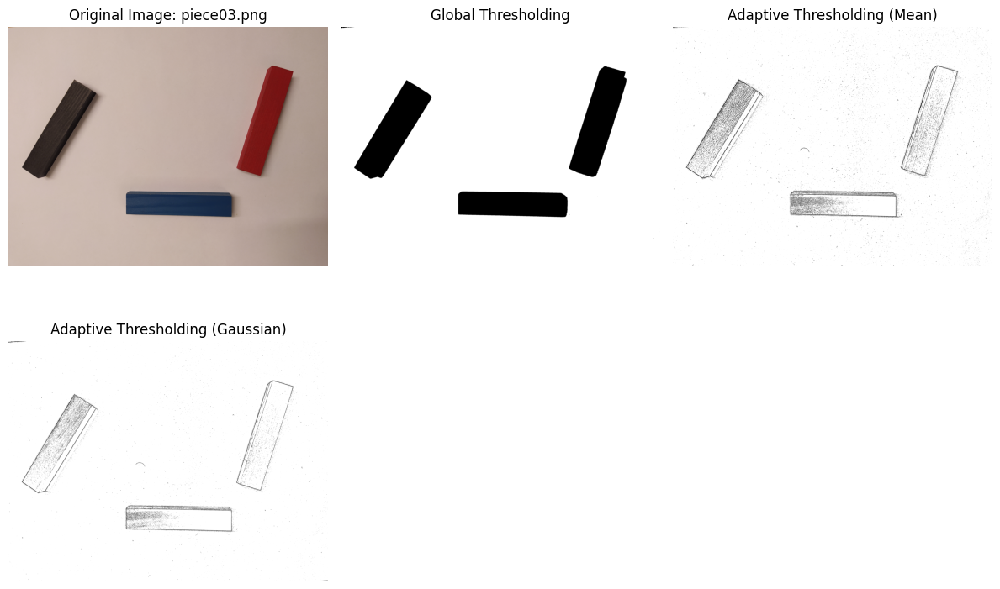

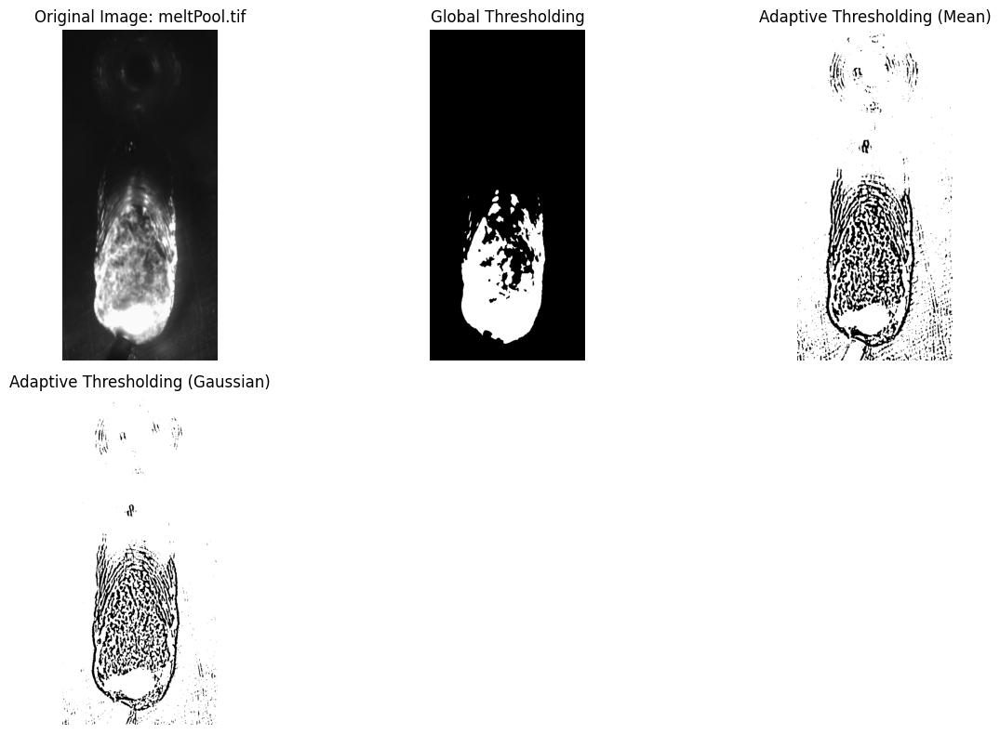

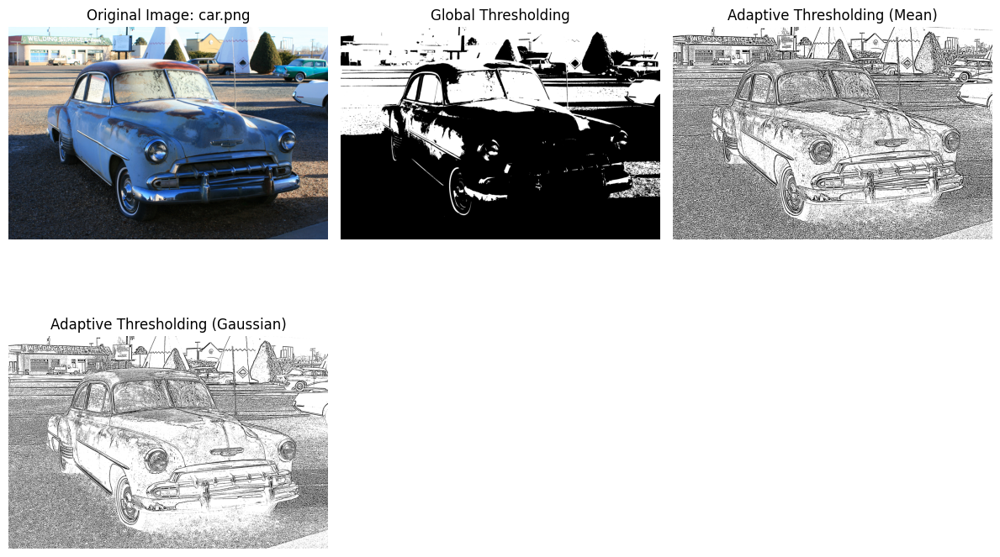

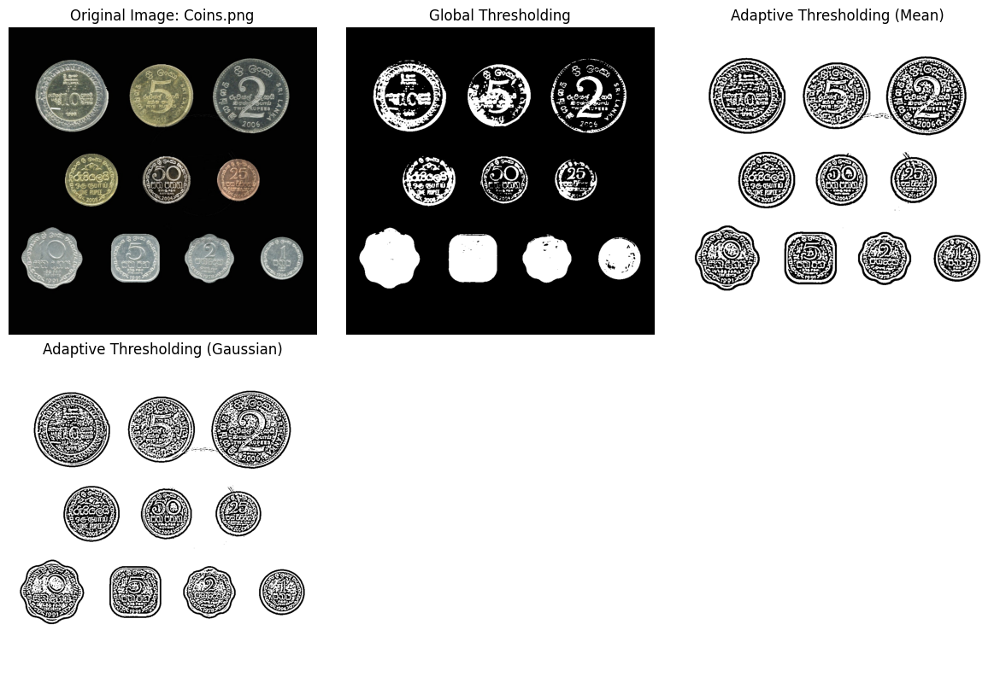

In [7]:
for i, file_name in enumerate(os.listdir(image_dir)):
    file_path = os.path.join(image_dir, file_name)
    
    image = cv2.imread(file_path)
    
    if image is None:
        print(f"Skipping {file_name}: Not a valid image.")
        continue

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

    _, global_thresholded = cv2.threshold(blurred_image, 127, 255, cv2.THRESH_BINARY)

    adaptive_thresholded_mean = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

    adaptive_thresholded_gaussian = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

    plt.figure(figsize=(12, 8))

    plt.subplot(2, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  
    plt.title(f'Original Image: {file_name}')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(global_thresholded, cmap='gray')
    plt.title('Global Thresholding')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(adaptive_thresholded_mean, cmap='gray')
    plt.title('Adaptive Thresholding (Mean)')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(adaptive_thresholded_gaussian, cmap='gray')
    plt.title('Adaptive Thresholding (Gaussian)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()